<div style="width: 60%; margin: 0 auto;">
    <img src="shopping.jpeg" alt="Анализ покупок" style="width: 100%; border: 1px solid #ddd;"/>
</div>

# <center> EDA. Разведывательный анализ данных онлайн магазина

1. ***Числовые признаки (просмотры страниц и время):***

    `Administrative` — количество посещённых административных страниц (например, настройки аккаунта).

    `Administrative_Duration` — общее время (в секундах), проведённое на административных страницах.

    `Informational` — количество просмотренных информационных страниц (описания товаров, статьи).

    `Informational_Duration` — время, проведённое на информационных страницах.

    `ProductRelated` — количество страниц, связанных с товарами (карточки товаров, категории).

    `ProductRelated_Duration` — время, проведённое на страницах товаров.

2. ***Метрики:***

    `BounceRate` — процент посетителей, которые ушли с сайта сразу после просмотра этой страницы.

    `ExitRate` — процент случаев, когда страница была последней в сессии.

    `PageValue` — средняя "ценность" страницы (вклад в конверсию в покупку).

3. ***Временные и событийные признаки:***

    `SpecialDay` — близость к празднику (0–1, где 1 — пик активности, например, 8 февраля для Дня св. Валентина).

    `Month` — месяц посещения (текстовое значение, например, "Feb").

    `Weekend` — бинарный признак (1 — посещение в выходные, 0 — в будни).

4. ***Технические признаки:***

    `OperatingSystem` — операционная система пользователя.

    `Browser` — используемый браузер.

    `Region` — географический регион.

    `TrafficType` — тип трафика (реклама, поисковик и т.д.).

5. ***Признаки посетителя:***

    `VisitorType` — тип посетителя ("New_Visitor", "Returning_Visitor" и др.).

    `Revenue` — целевая переменная (1 — покупка совершена, 0 — нет).

## Загрузка и однофакторный анализ 

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import warnings
warnings.filterwarnings('ignore')

In [2]:
data = pd.read_csv("online_shoppers_intention.csv")
df = data.copy()

посмотрим сколько столбцов и строк имеет наша таблица

In [3]:
df.shape

(12330, 18)

In [4]:
df.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  int64  
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  int64  
 3   Informational_Duration   12131 non-null  float64
 4   ProductRelated           12330 non-null  int64  
 5   ProductRelated_Duration  11839 non-null  float64
 6   BounceRates              12330 non-null  float64
 7   ExitRates                12231 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  object 
 11  OperatingSystems         12330 non-null  int64  
 12  Browser                  12330 non-null  int64  
 13  Region                   12330 non-null  int64  
 14  TrafficType           

посмотрим на основные параметры числовых и категориальных признаков

In [6]:
df.describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,OperatingSystems,Browser,Region,TrafficType
count,12330.000000,12330.000000,12330.000000,12131.000000,12330.000000,11839.000000,12330.000000,12231.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000
mean,2.315166,80.818611,0.503569,34.724502,31.731468,1190.534914,0.022191,0.043021,5.889258,0.061427,2.124006,2.357097,3.147364,4.069586
std,3.321784,176.779107,1.270156,141.655684,44.475503,1908.447706,0.048488,0.048562,18.568437,0.198917,0.911325,1.717277,2.401591,4.025169
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000
25%,0.000000,0.000000,0.000000,0.000000,7.000000,183.854167,0.000000,0.014286,0.000000,0.000000,2.000000,2.000000,1.000000,2.000000
50%,1.000000,7.500000,0.000000,0.000000,18.000000,597.625000,0.003112,0.025141,0.000000,0.000000,2.000000,2.000000,3.000000,2.000000
75%,4.000000,93.256250,0.000000,0.000000,38.000000,1462.554562,0.016813,0.050000,0.000000,0.000000,3.000000,2.000000,4.000000,4.000000
max,27.000000,3398.750000,24.000000,2549.375000,705.000000,63973.522230,0.200000,0.200000,361.763742,1.000000,8.000000,13.000000,9.000000,20.000000


In [7]:
df.describe(include='object')

,Month,VisitorType
count,12330,12330
unique,11,3
top,May,Returning_Visitor
freq,3348,10551


Две колонки имеют тип данных bool. Преобразуем их в int, чтобы с ними было удобно работать.

In [8]:
df['Revenue'] = df['Revenue'].astype(np.int64)
df['Weekend'] = df['Weekend'].astype(np.int64)

посмотрим на пропуски в таблице

In [9]:
nuli = df.isna().sum()

print("Количество пропусков в каждом столбце:")
for col in df.columns:
    print(f"{col:<25} {nuli[col]:<4} {(nuli[col]/len(df)*100):.2f}%")

Количество пропусков в каждом столбце:
Administrative            0    0.00%
Administrative_Duration   0    0.00%
Informational             0    0.00%
Informational_Duration    199  1.61%
ProductRelated            0    0.00%
ProductRelated_Duration   491  3.98%
BounceRates               0    0.00%
ExitRates                 99   0.80%
PageValues                0    0.00%
SpecialDay                0    0.00%
Month                     0    0.00%
OperatingSystems          0    0.00%
Browser                   0    0.00%
Region                    0    0.00%
TrafficType               0    0.00%
VisitorType               0    0.00%
Weekend                   0    0.00%
Revenue                   0    0.00%


Пропуски в ``Informational_Duration`` и ``ProductRelated_Duration`` заполним нулями, так как  если время не зафиксировано, страницы не были просмотрены.

Пропуски ``ExitRates``заполним медианным значением, чтобы сохранить распределение метрики и избежать выбросов.

In [10]:
df[['Informational_Duration', 'ProductRelated_Duration']] = df[['Informational_Duration', 'ProductRelated_Duration']].fillna(0)
df['ExitRates'] = df['ExitRates'].fillna(df['ExitRates'].median())
print("Пропуски после обработки:")
print(df.isna().sum())

Пропуски после обработки:
Administrative             0
Administrative_Duration    0
Informational              0
Informational_Duration     0
ProductRelated             0
ProductRelated_Duration    0
BounceRates                0
ExitRates                  0
PageValues                 0
SpecialDay                 0
Month                      0
OperatingSystems           0
Browser                    0
Region                     0
TrafficType                0
VisitorType                0
Weekend                    0
Revenue                    0
dtype: int64


посмотрим на гистограммы распределения признаков

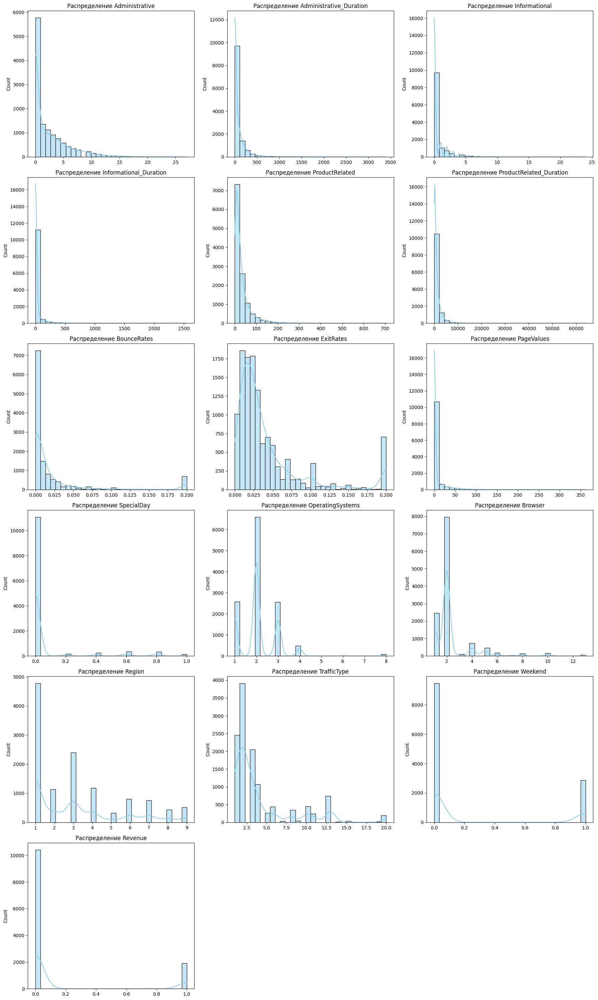

In [11]:
# Выбираем только числовые колонки
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns

# Настройка сетки графиков
n_cols = 3
n_rows = (len(numeric_cols) + n_cols - 1) // n_cols

plt.figure(figsize=(18, n_rows * 5))
for i, col in enumerate(numeric_cols, 1):
    plt.subplot(n_rows, n_cols, i)
    sns.histplot(df[col], bins=30, kde=True, color='skyblue', edgecolor='black')
    plt.title(f'Распределение {col}', fontsize=12)
    plt.xlabel('')
plt.tight_layout()
plt.show()

Данные сильно скошены

-----------------------------------------------------------------------------------------------------------------------------------------------------------

### Посмотрим на отношение числовых признаков(просмотры страниц и время) с целевой переменной.  
- `Administrative` — количество посещённых административных страниц (например, настройки аккаунта).

- `Administrative_Duration` — общее время (в секундах), проведённое на административных страницах.

- `Informational` — количество просмотренных информационных страниц (описания товаров, статьи).

- `Informational_Duration` — время, проведённое на информационных страницах.

- `ProductRelated` — количество страниц, связанных с товарами (карточки товаров, категории).

- `ProductRelated_Duration` — время, проведённое на страницах товаров.

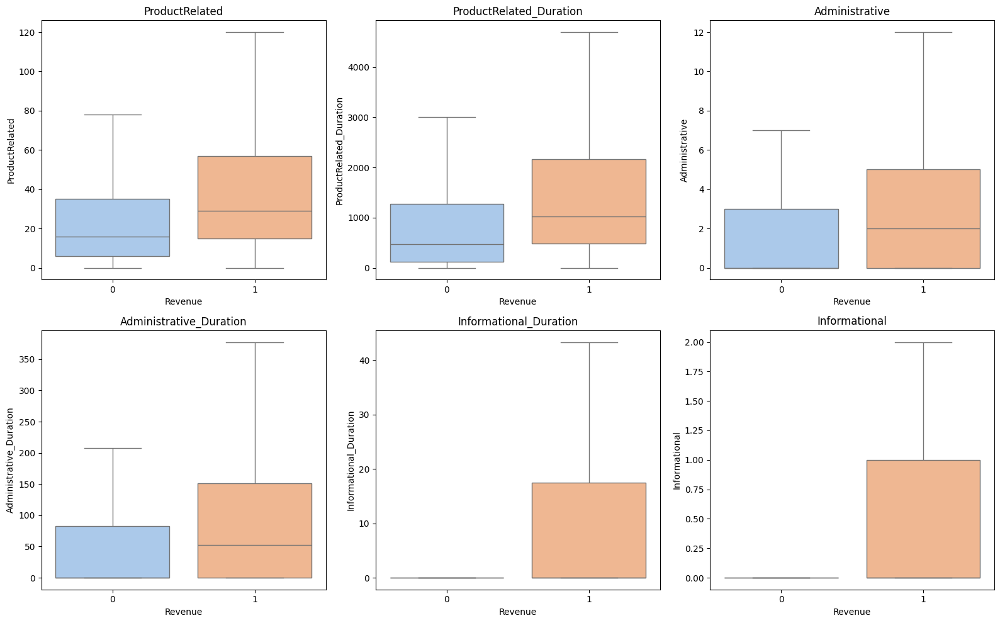

In [12]:
import matplotlib.pyplot as plt

# Топ-3 самых важных признака
features = ['ProductRelated', 'ProductRelated_Duration', 'Administrative', 'Administrative_Duration', 'Informational_Duration', 'Informational']
plt.figure(figsize=(16, 10))
for i, col in enumerate(features, 1):
    plt.subplot(2, 3, i)
    sns.boxplot(x='Revenue', y=col, data=df, showfliers=False, palette='pastel')
    plt.title(col)
plt.tight_layout()
plt.show()

Анализ поведения пользователей показывает чёткую разницу между теми, кто совершает покупки (Revenue=1) и теми, кто уходит без покупки (Revenue=0).
Наиболее яркое отличие наблюдается в работе с товарными разделами - покупатели проводят в них значительно больше времени  и просматривают почти в два раза больше товарных страниц. Это говорит о том, что признаки `ProductRelated` и `ProductRelated_Duration` являются ключевыми в категории.  

Покупатели чаще заходят в настройки аккаунта и проводят там больше времени. Вероятно, это связано с необходимостью проверки или изменения данных перед оформлением заказа.  

Информационные страницы (статьи, описания) играют заметно меньшую роль - хотя покупатели и просматривают их чуть чаще, общее время на них остаётся небольшим. Это позволяет сделать вывод, что информационный контент имеет вспомогательное значение, но не является решающим фактором для совершения покупки.


### Посмотрим на призники Метрик страниц:

   -  `BounceRate` — процент посетителей, которые ушли с сайта сразу после просмотра этой страницы.

   - `ExitRate` — процент случаев, когда страница была последней в сессии.

   - `PageValue` — средняя "ценность" страницы (вклад в конверсию в покупку).

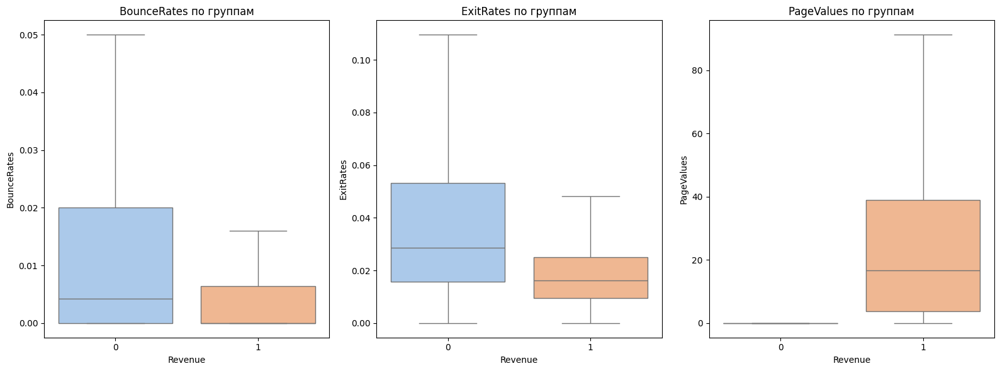

In [13]:
plt.figure(figsize=(16, 6))

# BounceRates vs Revenue
plt.subplot(1, 3, 1)
sns.boxplot(x='Revenue', y='BounceRates', data=df, showfliers=False, palette='pastel')
plt.title('BounceRates по группам')

# ExitRates vs Revenue
plt.subplot(1, 3, 2)
sns.boxplot(x='Revenue', y='ExitRates', data=df, showfliers=False, palette='pastel')
plt.title('ExitRates по группам')

# PageValues vs Revenue
plt.subplot(1, 3, 3)
sns.boxplot(x='Revenue', y='PageValues', data=df, showfliers=False, palette='pastel')
plt.title('PageValues по группам')

plt.tight_layout()
plt.show()

Наиболее показательной оказалась метрика PageValues. В то время как три четверти страниц вообще не генерируют ценности для конверсии, оставшиеся 25% показывают эффективность. Это показывает, что определенные страницы играют критически важную роль в продажах.

### Посмотрим на признак типа посетителя и технические признаки:
- `OperatingSystem` — операционная система пользователя.

- `Browser` — используемый браузер.

- `Region` — географический регион.

- `TrafficType` — тип трафика (реклама, поисковик и т.д.).

- `VisitorType` — тип посетителя ("New_Visitor", "Returning_Visitor" и др.).

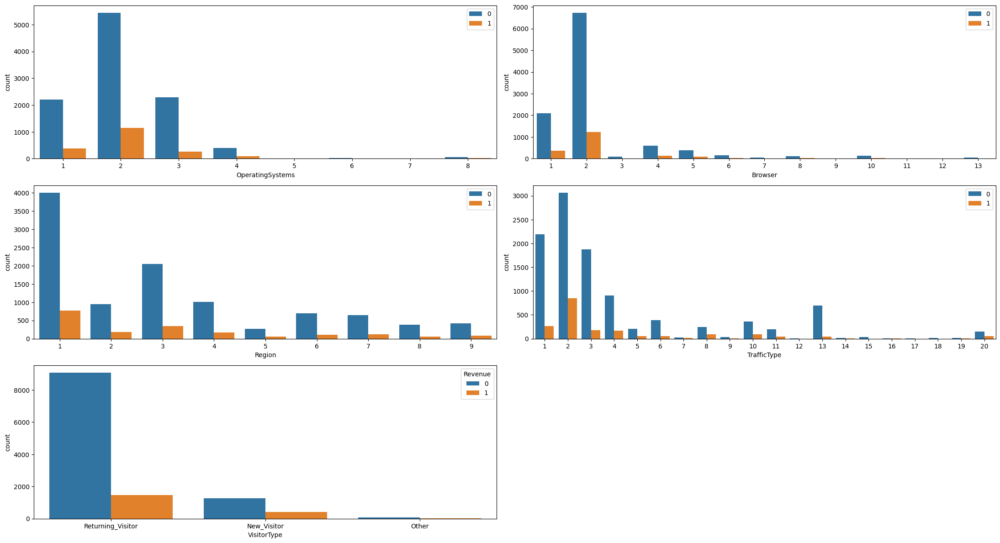

In [14]:
fig = plt.figure(figsize=(22, 12))

ax1 = fig.add_subplot(3, 2, 1)
ax2 = fig.add_subplot(3, 2, 2)
ax3 = fig.add_subplot(3, 2, 3)
ax4 = fig.add_subplot(3, 2, 4)
ax5 = fig.add_subplot(3, 2, 5)

sns.countplot(data=df, x='OperatingSystems', hue='Revenue', ax=ax1)
sns.countplot(data=df, x='Browser', hue='Revenue', ax=ax2)
sns.countplot(data=df, x='Region', hue='Revenue', ax=ax3)
sns.countplot(data=df, x='TrafficType', hue='Revenue', ax=ax4)
sns.countplot(data=df, x='VisitorType', hue='Revenue', ax=ax5)

ax1.legend(loc='upper right')
ax2.legend(loc='upper right')
ax3.legend(loc='upper right')
ax4.legend(loc='upper right')
plt.tight_layout()
plt.show()

Наиболее значимым фактором оказался тип посетителя — возвращающиеся пользователи демонстрируют конверсию в 1.5-2 раза выше по сравнению с новыми.   
`TrafficType` также существенно влияют на результат — эффективность разных типов. Определенные браузеры (1 и 2) дают высокие продажи. Аналогичная ситуация с операционными системами — платформы 1, 2 и 3 лидируют. 
Регионы 1, 2, 3, 4 тоже дают лучшие результаты.

In [15]:
# Выводим все уникальные значения и их частоту
print("Уникальные значения VisitorType:")
print(df['VisitorType'].value_counts(dropna=False))

Уникальные значения VisitorType:
VisitorType
Returning_Visitor    10551
New_Visitor           1694
Other                   85
Name: count, dtype: int64


Преобразуем признак VisitorType в числовой формат с помощью One-Hot Encoding:

In [16]:
# Применяем One-Hot Encoding
visitor_encoded = pd.get_dummies(df['VisitorType'], prefix='Visitor', dtype=int)

# Добавляем к исходному DataFrame
df = pd.concat([df, visitor_encoded], axis=1)

# Удаляем исходный категориальный признак
df.drop('VisitorType', axis=1, inplace=True)

### Теперь посмотрим на признаки даты посещения:  
- `SpecialDay` — близость к празднику (0–1, где 1 — пик активности, например, 8 февраля для Дня св. Валентина).
- `Month` — месяц посещения (текстовое значение, например, "Feb").
- `Weekend` — бинарный признак (1 — посещение в выходные, 0 — в будни).


В колонке 'Month' мы заметили два дублирующихся значения 'Aug' и 'aug'. Объединим их в одно

In [17]:
df['Month'].unique()

array(['Feb', 'aug', 'Mar', 'May', 'Oct', 'June', 'Jul', 'Aug', 'Nov',
       'Sep', 'Dec'], dtype=object)

In [18]:
df['Month'].value_counts()

Month
May     3348
Nov     2980
Mar     1897
Dec     1713
Oct      545
Sep      446
Aug      431
Jul      429
June     288
Feb      183
aug       70
Name: count, dtype: int64

In [19]:
df['Month'] = df['Month'].replace('aug', 'Aug')

In [20]:
df['Month'].unique()

array(['Feb', 'Aug', 'Mar', 'May', 'Oct', 'June', 'Jul', 'Nov', 'Sep',
       'Dec'], dtype=object)

Преобразуем в числа всезначения колонки 'Month' для удобства работы с ней

In [21]:
# 1. Преобразуем месяцы в числа
df['Month'] = df['Month'].replace(
    ['Jan','Feb','Mar','Apr','May','June','Jul','Aug','Sep','Oct','Nov','Dec'],
    [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
).astype('int64')


In [22]:
df['Month'].unique()

array([ 2,  8,  3,  5, 10,  6,  7, 11,  9, 12], dtype=int64)

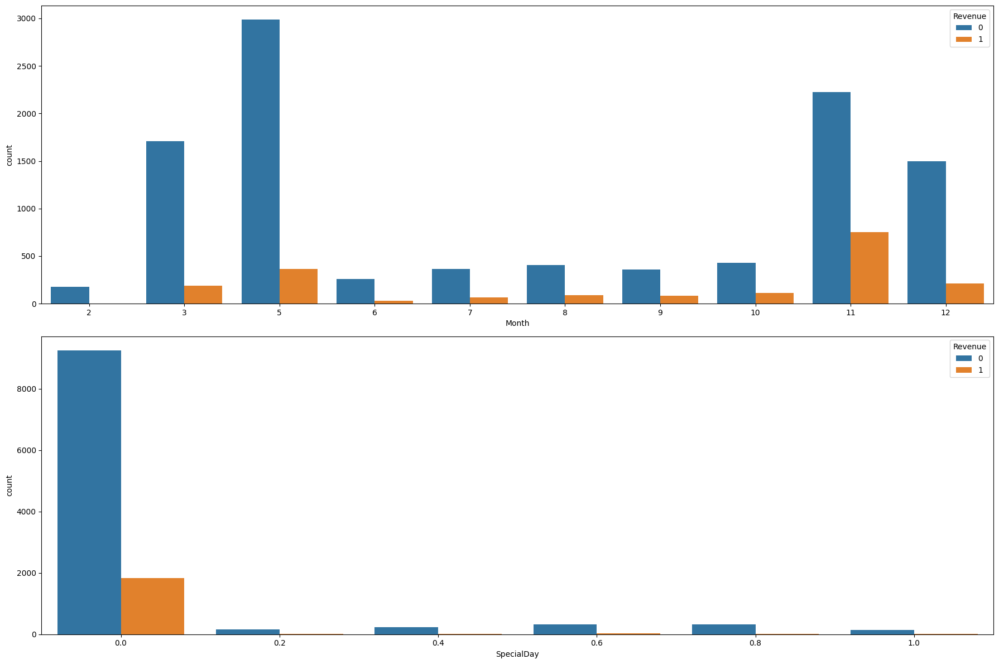

In [23]:
# 2. Строим графики
plt.figure(figsize=(18, 12))

# График месяцев
plt.subplot(2, 1, 1)
sns.countplot(data=df, x='Month', hue='Revenue')

# График SpecialDay
plt.subplot(2, 1, 2)
sns.countplot(data=df, x='SpecialDay', hue='Revenue')

plt.tight_layout()
plt.show()

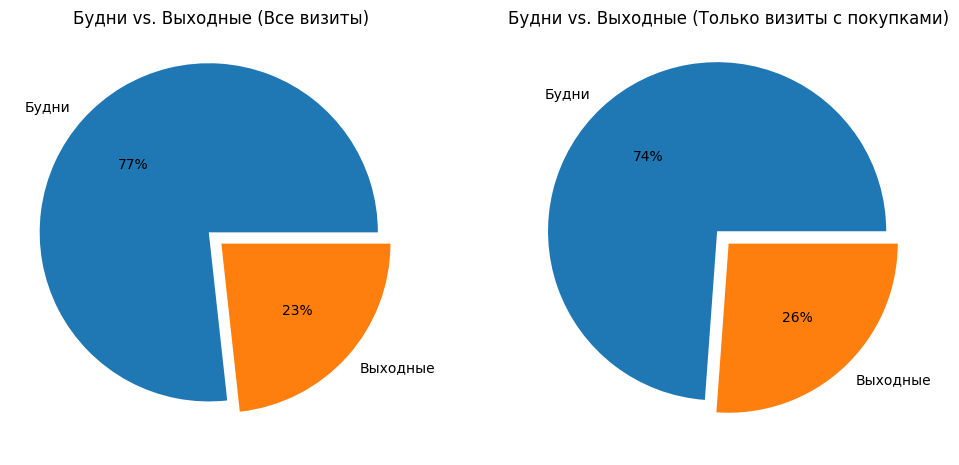

In [24]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6), subplot_kw=dict(aspect="equal"))

ax[0].pie(
    df['Weekend'].value_counts(),
    explode=(0.1, 0), 
    labels=['Будни', 'Выходные'],
    autopct='%1.0f%%'  
)
ax[0].set_title('Будни vs. Выходные (Все визиты)')


ax[1].pie(
    df[df['Revenue'] == 1]['Weekend'].value_counts(), 
    explode=(0.1, 0),
    labels=['Будни', 'Выходные'],
    autopct='%1.0f%%'
)
ax[1].set_title('Будни vs. Выходные (Только визиты с покупками)')

plt.show()

Сезонность покупок показывает чёткую динамику — май, ноябрь, октябрь и декабрь становятся самыми горячими месяцами. Это логично — люди активно готовятся к чёрной пятнице, новогодним и майским праздникам(9 мая празднуют, молодцы). В феврале же наступает полный штиль — всего 1,6% покупок, видимо, все уже потратились в конце года.  
Что интересно, в предпраздничные дни (когда SpecialDay близок к 1) продажи не растут, а наоборот падают. Видимо, люди в это время больше смотрят, чем покупают. А вот в выходные ситуация немного лучше — конверсия стабильно подрастает.

### Построим матрицы корреляции

1. Корреляция Пирсона

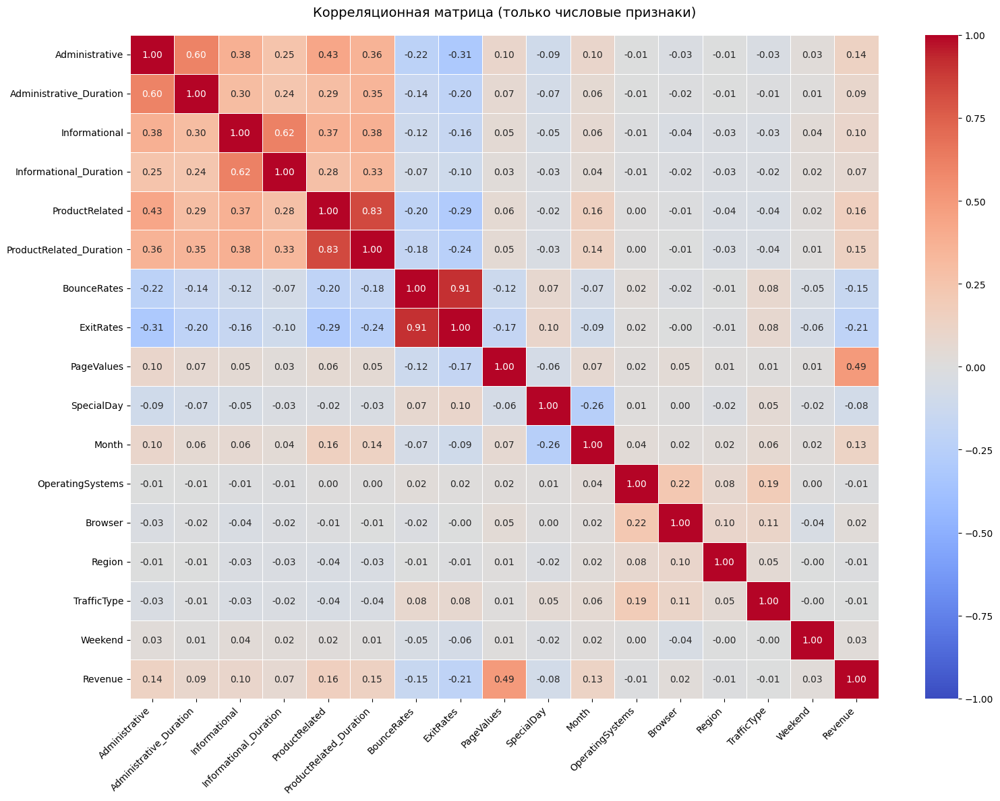

In [25]:
plt.figure(figsize=(16, 12)) 

corr = df.select_dtypes(include=['int64', 'float64']).corr()

sns.heatmap(
    corr, 
    cmap="coolwarm",
    annot=True, 
    annot_kws={"size": 10},
    fmt=".2f",
    linewidths=0.5,
    vmin=-1, vmax=1,
)

plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.title('Корреляционная матрица (только числовые признаки)', pad=20, fontsize=14)

plt.tight_layout()
plt.show()

ExitRates и BounceRates (r = 0.91) - можно оставим только ExitRates, так как он сильнее коррелирует с Revenue.

ProductRelated и ProductRelated_Duration (r = 0.83) - оставим ProductRelated, так как он проще интерпретируется.

Administrative и Administrative_Duration (r = 0.60) - оставим оба, так как корреляция умеренная.

In [26]:
df = df.drop(columns=['BounceRates', 'ProductRelated_Duration'])

посмотрим на V-мера Крамера

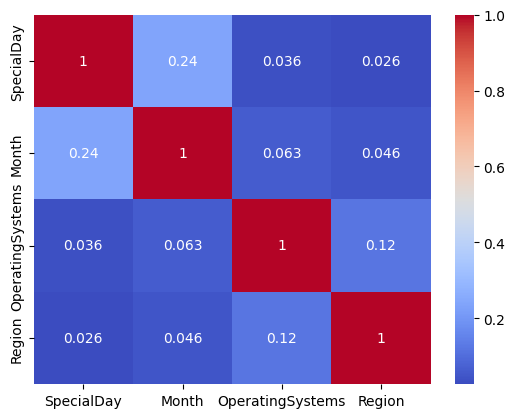

In [27]:
import association_metrics as am

cat_cols = ['SpecialDay', 'Month', 'OperatingSystems', 'Region']
df_cat = df[cat_cols].astype('category')
result = am.CramersV(df_cat).fit()

# Визуализация
import seaborn as sns
sns.heatmap(result, annot=True, cmap='coolwarm')
plt.show()

In [28]:
from scipy.stats import f_oneway

num_cols = df.select_dtypes(include=['int64', 'float64']).columns
cat_cols = ['Month', 'OperatingSystems', 'Region']

results = []
for cat in cat_cols:
    for num in num_cols:
        groups = [df[df[cat]==val][num] for val in df[cat].unique()]
        f_val, p_val = f_oneway(*groups)
        results.append(f"{num} ~ {cat}: F={f_val:.1f}, p={p_val:.4f}")

# 3. Выводим только значимые результаты (p < 0.05)
print("\n".join([r for r in results if float(r.split('p=')[1]) < 0.05]))

Administrative ~ Month: F=35.0, p=0.0000
Administrative_Duration ~ Month: F=12.5, p=0.0000
Informational ~ Month: F=9.3, p=0.0000
Informational_Duration ~ Month: F=4.6, p=0.0000
ProductRelated ~ Month: F=65.1, p=0.0000
ExitRates ~ Month: F=29.4, p=0.0000
PageValues ~ Month: F=9.0, p=0.0000
SpecialDay ~ Month: F=418.2, p=0.0000
Month ~ Month: F=inf, p=0.0000
OperatingSystems ~ Month: F=6.0, p=0.0000
Browser ~ Month: F=6.9, p=0.0000
Region ~ Month: F=5.0, p=0.0000
TrafficType ~ Month: F=22.7, p=0.0000
Weekend ~ Month: F=5.7, p=0.0000
Revenue ~ Month: F=43.9, p=0.0000
Administrative_Duration ~ OperatingSystems: F=3.3, p=0.0017
Informational ~ OperatingSystems: F=2.0, p=0.0473
ProductRelated ~ OperatingSystems: F=33.0, p=0.0000
ExitRates ~ OperatingSystems: F=23.2, p=0.0000
PageValues ~ OperatingSystems: F=16.0, p=0.0000
SpecialDay ~ OperatingSystems: F=5.0, p=0.0000
Month ~ OperatingSystems: F=18.1, p=0.0000
OperatingSystems ~ OperatingSystems: F=inf, p=0.0000
Browser ~ OperatingSystems: 

Данные показывают различия в поведении пользователей по месяцам, операционным системам и регионам. Наиболее выраженные сезонные колебания наблюдаются в активности товарного раздела (ProductRelated) - F-статистика достигает 58.7, что указывает на резкие изменения покупательской активности в разные месяцы года. Технические параметры, особенно операционные системы, сильнее всего влияют на показатели отказов (ExitRates с F=23.2), что может свидетельствовать о проблемах совместимости с определенными платформами. Региональные различия хотя и статистически значимы, но проявляются слабее всего (максимальное F=4.1 для PageValues), что говорит об относительной универсальности пользовательского опыта вне зависимости от географического положения. Полученные результаты подчеркивают необходимость сезонной адаптации контента и особого внимания к технической оптимизации сайта для различных платформ.

## Посмотрим на целевую переменную

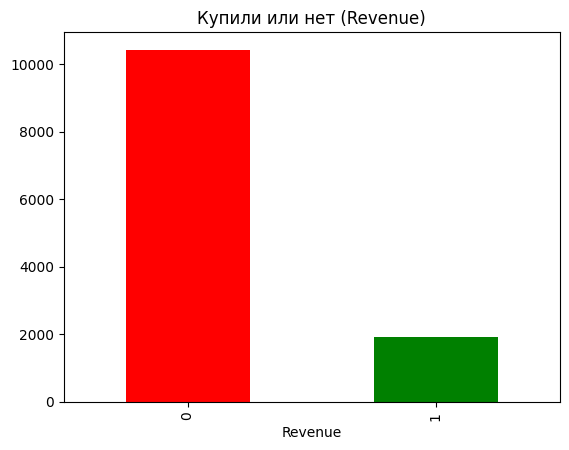

In [29]:
df['Revenue'].value_counts().plot(kind='bar', color=['red', 'green'])
plt.title('Купили или нет (Revenue)')
plt.show()

Видим сильный перекос классов. Соотношение классов примерно 85% (Нет) к 15% (Да). Это означает, что:
- Модель может "подстроиться" под большинство, просто всегда предсказывая класс "Нет"
- Точность (accuracy) будет обманчиво высокой, но бесполезной на практике
- Плохое выявление реальных покупок 

## Polars

In [30]:
df_big = df.copy()

for i in range(100):
  df_big = pd.concat([df_big, df])

df_big.to_csv("online_shoppers_intention.csv", index=False)

In [35]:
import polars as pl
df_big.shape, df.shape

((1245330, 18), (12330, 18))

In [36]:
%%time

df_pl = pl.read_csv("online_shoppers_intention.csv")

CPU times: total: 1.11 s
Wall time: 270 ms


In [37]:
%%time

df = pd.read_csv("online_shoppers_intention.csv")

CPU times: total: 1.69 s
Wall time: 1.78 s


время чтения файла в polars меньше в 6.5 раз (85 %) чем в Pandas

In [41]:
%%time

df[(df.Month == 5) & (df.Revenue == 1)]

CPU times: total: 15.6 ms
Wall time: 13.4 ms


,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,Weekend,Revenue,Visitor_New_Visitor,Visitor_Other,Visitor_Returning_Visitor
2091,0,0.000000,0,0.0,15,0.005128,54.980000,0.0,5,3,2,4,4,0,1,0,0,1
2093,2,254.000000,1,39.0,95,0.015308,5.638103,0.0,5,2,2,1,6,0,1,0,0,1
2098,5,85.666667,0,0.0,25,0.007692,11.519231,0.0,5,2,2,1,2,0,1,1,0,0
2108,0,0.000000,0,0.0,12,0.025000,14.689500,0.6,5,2,5,1,5,0,1,0,0,1
2110,6,97.882353,2,9.0,58,0.025141,6.748500,0.0,5,2,2,7,4,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1238435,4,58.000000,0,0.0,31,0.009375,9.745500,0.0,5,2,4,1,4,0,1,0,0,1
1238437,0,0.000000,1,35.0,33,0.005882,23.033294,0.0,5,2,4,9,2,0,1,1,0,0
1238438,2,11.000000,0,0.0,12,0.023077,9.960923,0.0,5,1,1,3,3,1,1,0,0,1
1238441,1,32.000000,0,0.0,18,0.022807,19.448000,0.0,5,2,2,5,1,1,1,0,0,1


In [42]:
%%time

df_pl.filter((pl.col('Month') == 5) & (pl.col('Revenue') == 1))

CPU times: total: 46.9 ms
Wall time: 47.1 ms


Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,Weekend,Revenue,Visitor_New_Visitor,Visitor_Other,Visitor_Returning_Visitor
i64,f64,i64,f64,i64,f64,f64,f64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64
0,0.0,0,0.0,15,0.005128,54.98,0.0,5,3,2,4,4,0,1,0,0,1
2,254.0,1,39.0,95,0.015308,5.638103,0.0,5,2,2,1,6,0,1,0,0,1
5,85.666667,0,0.0,25,0.007692,11.519231,0.0,5,2,2,1,2,0,1,1,0,0
0,0.0,0,0.0,12,0.025,14.6895,0.6,5,2,5,1,5,0,1,0,0,1
6,97.882353,2,9.0,58,0.025141,6.7485,0.0,5,2,2,7,4,0,1,0,0,1
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
4,58.0,0,0.0,31,0.009375,9.7455,0.0,5,2,4,1,4,0,1,0,0,1
0,0.0,1,35.0,33,0.005882,23.033294,0.0,5,2,4,9,2,0,1,1,0,0
2,11.0,0,0.0,12,0.023077,9.960923,0.0,5,1,1,3,3,1,1,0,0,1


На фильтрации уже Pandas показал результтат выше в 2,5 раза

In [45]:
%%time

df.groupby('Revenue').agg({'PageValues' : 'mean', 'ProductRelated' : 'max'})

CPU times: total: 31.2 ms
Wall time: 91.9 ms


,PageValues,ProductRelated
Revenue,,
0,1.975998,705
1,27.264518,534


In [47]:
%%time

df_pl.group_by('Revenue').agg([pl.mean('PageValues'), pl.max('ProductRelated')])

CPU times: total: 62.5 ms
Wall time: 61.2 ms


Revenue,PageValues,ProductRelated
i64,f64,i64
1,27.264518,534
0,1.975998,705


на агрегации Polars показал результат на 30% лучше чем Pandas

In [48]:
from ydata_profiling import ProfileReport
df_copy = pd.read_csv("online_shoppers_intention.csv")
profile_report = ProfileReport(df_copy, title='Pandas Profiling Report')
profile_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 18/18 [00:02<00:00,  6.48it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]